In [1]:
# import dependencies
import scanpy as sc
import pandas as pd
import numpy as np
import os
import loompy as lp
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['font.sans-serif'] = "Arial"
sc.settings.set_figure_params(dpi = 50, dpi_save = 600, figsize = (4, 4))

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied

In [4]:
pip install numpy==1.21.2

  Using cached numpy-1.21.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (15.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3
Note: you may need to restart the kernel to use updated packages.


In [2]:
# set variables for file paths to read from and write to:

# set a working directory
wdir = "/public/home/zhaox/pigscRNA-seq/"
os.chdir( wdir )

# path to unfiltered loom file (this will be created in the optional steps below)
f_loom_path_unfilt = "adultgerm_removeothers0504_unfiltered.loom" 

# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = "adultgerm_removeothers0504_filtered_scenic.loom"

# path to anndata object, which will be updated to store Scanpy results as they are generated below
f_anndata_path = "adultgerm_removeothers0504_anndata.h5ad"

# path to pyscenic output
f_pyscenic_output = "adultgerm_removeothers0504__pyscenic_output.loom"

# loom output, generated from a combination of Scanpy and pySCENIC results:
f_final_loom = 'adultgerm_removeothers0504_scenic_integrated-output.loom'

sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 5

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 9.5.0
asttokens           NA
backcall            0.2.0
cloudpickle         2.2.1
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
cytoolz             0.12.1
dask                2023.5.0
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
executing           1.2.0
h5py                3.8.0
ipykernel           6.25.2
jedi                0.18.2
jinja2              3.1.2
joblib              1.2.0
kiwisolver          1.4.4
llvmlite            0.40.0
loompy              3.0.7
lz4                 4.3.2
markupsafe          2.1.2
matplotlib          3.7.1
matplotlib_inline   0.1.6
mpl_toolkits        NA
natsort             8.3.1
numba               0.57.0
numexpr             2.8.4
numpy               1.21.2
numpy_groupies      0.9.22
packaging           23.1
pandas              2.0.1
parso               0.8.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources  

In [80]:
adata = sc.read('/public/home/zhaox/pigscRNA-seq/figures/figures/fig3_adult_somaticgermCCC(removeothers)_rawdata_0428.h5ad') 
adata

AnnData object with n_obs × n_vars = 3655 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chrX', 'chrY', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'connectivities', 'distances'

In [81]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 2227 genes that are detected in less than 3 cells


In [5]:
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(adata.var_names) ,
}
col_attrs = {
    "CellID": np.array(adata.obs_names) ,
    "nGene": np.array( np.sum(adata.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(adata.X.transpose() , axis=0)).flatten() ,
}
lp.create(f_loom_path_scenic, adata.X.transpose(), row_attrs, col_attrs)

In [6]:
# transcription factors list
f_tfs = "/public/home/zhaox/pigscRNA-seq/hs_hgnc_tfs.txt" # human

In [7]:
f_loom_path_scenic

'adultgerm_removeothers0504_filtered_scenic.loom'

In [6]:
!pyscenic grn {f_loom_path_scenic} {f_tfs} -o adj.csv --num_workers 5

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied

In [ ]:
## pyscenic 可视化(http://htmlpreview.github.io/?https://github.com/aertslab/SCENICprotocol/blob/master/notebooks/PBMC10k_downstream-analysis.html)
## 单细胞转录组实战06: pySCENIC转录因子分析（可视化）
## 原创 生信探索 生信探索 2023-02-22 08:00 发表于云南
# 单细胞转录组实战06: pySCENIC转录因子分析（docker）

In [3]:
from pathlib import Path
import operator
import cytoolz

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from pyscenic.utils import load_motifs
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.plotting import plot_binarization, plot_rss
from pyscenic.transform import df2regulons

In [82]:
adata = sc.read('/public/home/zhaox/pigscRNA-seq/figures/figures/fig3_adult_somaticgermCCC(removeothers)_rawdata_0428.h5ad') 
adata

AnnData object with n_obs × n_vars = 3655 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chrX', 'chrY', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'connectivities', 'distances'

In [14]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [11]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

In [5]:
def fetch_logo(regulon, base_url = "http://motifcollections.aertslab.org/v10/logos/"):
    for elem in regulon.context:
        if elem.endswith('.png'):
            return '<img src="{}{}" style="max-height:124px;"></img>'.format(base_url, elem)
    return ""

In [6]:
df_motifs = load_motifs('/public/home/zhaox/pigscRNA-seq/adultgerm0504_reg.csv')

In [7]:
df_motifs

Enrichment             
                                                             AUC       NES   
TF     MotifID                                                               
ALX1   cisbp__M1189                                     0.079555  3.360715  \
ALX3   cisbp__M1091                                     0.072202  3.050986   
       cisbp__M1025                                     0.075141  3.308126   
       taipale__HOXB2_DBD_NNYMATTANN                    0.071622  3.000252   
       cisbp__M1017                                     0.071733  3.010020   
...                                                          ...       ...   
ZNF436 transfac_pro__M06474                             0.072486  3.627393   
       transfac_pro__M06656                             0.072664  3.644605   
ZNF641 transfac_pro__M05417                             0.062496  3.041720   
ZNF740 flyfactorsurvey__CG7368_SOLEXA_2.5_FBgn0036179   0.073161  3.195254   
       c2h2_zfs__M4021                                  0.072512  3.135562   

                                                                              
                                                      MotifSimilarityQvalue   
TF     MotifID                                                                
ALX1   cisbp__M1189                                                0.000044  \
ALX3   cisbp__M1091                                                0.000790   
       cisbp__M1025                                                0.000384   
       taipale__HOXB2_DBD_NNYMATTANN                               0.000344   
       cisbp__M1017                                                0.000257   
...                                                                     ...   
ZNF436 transfac_pro__M06474                                        0.000000   
       transfac_pro__M06656                                        0.000000   
ZNF641 transfac_pro__M05417                                        0.000000   
ZNF740 flyfactorsurvey__CG7368_SOLEXA_2.5_FBgn0036179              0.000307   
       c2h2_zfs__M4021                                             0.000307   

                                                                            
                                                      OrthologousIdentity   
TF     MotifID                                                              
ALX1   cisbp__M1189                                              1.000000  \
ALX3   cisbp__M1091                                              1.000000   
       cisbp__M1025                                              1.000000   
       taipale__HOXB2_DBD_NNYMATTANN                             1.000000   
       cisbp__M1017                                              1.000000   
...                                                                   ...   
ZNF436 transfac_pro__M06474                                      0.946903   
       transfac_pro__M06656                                      1.000000   
ZNF641 transfac_pro__M05417                                      1.000000   
ZNF740 flyfactorsurvey__CG7368_SOLEXA_2.5_FBgn0036179            0.894444   
       c2h2_zfs__M4021                                           0.894444   

                                                                                                           
                                                                                              Annotation   
TF     MotifID                                                                                             
ALX1   cisbp__M1189                                    motif similar to transfac_pro__M01453 ('V$CART...  \
ALX3   cisbp__M1091                                    motif similar to taipale__ALX3_DBD_NNYAATTANN ...   
       cisbp__M1025                                    motif similar to cisbp__M5284 ('ALX3[gene ID: ...   
       taipale__HOXB2_DBD_NNYMATTANN                   motif similar to cisbp__M5284 ('ALX3[gene ID: ...   
       cisbp__M1017

In [9]:
selected_motifs = ['E2F2','E2F1','TRPS1','BARX2','KLF10','WT1','GATA4','NR5A1','NR2F6','ETV4','E2F7','HES6','STAT1',
                  'PRRX2','CTCFL','POLR3G','TCF12','NKX2-3','SOX5','DLX6','ARID3A','LHX4','TBR1','STAT6','HNF4A','JDP2','MYLK']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]
df_motifs_sel

Enrichment             
                                               AUC       NES   
TF     MotifID                                                 
ARID3A cisbp__M5441                       0.050242  3.124257  \
BARX2  cisbp__M1010                       0.075917  4.030031   
       cisbp__M1013                       0.072248  3.666524   
       cisbp__M0976                       0.065929  3.040476   
       cisbp__M1156                       0.066264  3.073608   
...                                            ...       ...   
STAT1  hocomoco__CTCFL_MOUSE.H11MO.0.A    0.046092  3.703642   
       dbcorrdb__MYC__ENCSR000DMM_1__m1   0.043622  3.260302   
STAT6  tfdimers__MD00089                  0.082129  4.081015   
WT1    cisbp__M2324                       0.050006  3.010663   
       cisbp__M4504                       0.050386  3.076388   

                                                                
                                        MotifSimilarityQvalue   
TF     MotifID                                                  
ARID3A cisbp__M5441                                  0.000757  \
BARX2  cisbp__M1010                                  0.000999   
       cisbp__M1013                                  0.000650   
       cisbp__M0976                                  0.000601   
       cisbp__M1156                                  0.000285   
...                                                       ...   
STAT1  hocomoco__CTCFL_MOUSE.H11MO.0.A               0.000792   
       dbcorrdb__MYC__ENCSR000DMM_1__m1              0.000553   
STAT6  tfdimers__MD00089                             0.000000   
WT1    cisbp__M2324                                  0.000005   
       cisbp__M4504                                  0.000004   

                                                              
                                        OrthologousIdentity   
TF     MotifID                                                
ARID3A cisbp__M5441                                1.000000  \
BARX2  cisbp__M1010                                0.872792   
       cisbp__M1013                                0.872792   
       cisbp__M0976                                0.872792   
       cisbp__M1156                                0.885305   
...                                                     ...   
STAT1  hocomoco__CTCFL_MOUSE.H11MO.0.A             1.000000   
       dbcorrdb__MYC__ENCSR000DMM_1__m1            1.000000   
STAT6  tfdimers__MD00089                           1.000000   
WT1    cisbp__M2324                                1.000000   
       cisbp__M4504                                1.000000   

                                                                                             
                                                                                Annotation   
TF     MotifID                                                                               
ARID3A cisbp__M5441                      motif similar to dbcorrdb__ARID3A__ENCSR000EDP...  \
BARX2  cisbp__M1010                      motif similar to cisbp__M0990 ('Barx2[gene ID:...   
       cisbp__M1013                      motif similar to cisbp__M0990 ('Barx2[gene ID:...   
       cisbp__M0976                      motif similar to cisbp__M0990 ('Barx2[gene ID:...   
       cisbp__M1156                      gene is orthologous to ENSMUSG00000032033 in M...   
...                                                                                    ...   
STAT1  hocomoco__CTCFL_MOUSE.H11MO.0.A   motif similar to dbcorrdb__STAT1__ENCSR000DZM_...   
       dbcorrdb__MYC__ENCSR000DMM_1__m1  motif similar to dbcorrdb__STAT1__ENCSR000DZM_...   
STAT6  tfdimers__MD00089                                        gene is directly annotated   
WT1    cisbp__M2324                      gene is annotated for similar motif hocomoco__...   
       cisbp__M4504                      motif similar to transfac_pro__M03893 ('V$WT1_...   

                                

In [18]:
#display_logos(df_motifs.head())
motiflogo = display_logos(df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False))
motiflogo

In [78]:
##'TBR1','STAT6','HNF4A','JDP2','MYLK'
selected_motifs = ['PHOX2A','ATF6']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]
df_motifs_sel

Enrichment             
                                                           AUC       NES   
TF     MotifID                                                             
ATF6   cisbp__M0284                                   0.058603  3.387311  \
       cisbp__M0300                                   0.057422  3.258975   
       cisbp__M0263                                   0.061274  3.677620   
       flyfactorsurvey__Atf-2_SANGER_5_FBgn0050420    0.056278  3.134597   
       taipale_cyt_meth__FOSL1_NRTGAYGTCAYN_FL_meth   0.056185  3.124421   
PHOX2A transfac_pro__M07835                           0.096389  3.100220   
       hocomoco__ARX_HUMAN.H11MO.0.D                  0.099502  3.503597   
ATF6   dbcorrdb__JUN__ENCSR000EEK_1__m1               0.082172  3.535345   
       transfac_pro__M01861                           0.049087  3.132863   
       taipale_cyt_meth__ATF2_NRTGAYGTMAYN_FL_meth    0.048495  3.035457   
       cisbp__M6180                                   0.049483  3.198117   
       taipale_cyt_meth__ATF2_NRTGAYGTMAYN_FL         0.049921  3.270219   
       taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL         0.048884  3.099570   

                                                                            
                                                    MotifSimilarityQvalue   
TF     MotifID                                                              
ATF6   cisbp__M0284                                              0.000163  \
       cisbp__M0300                                              0.000128   
       cisbp__M0263                                              0.000085   
       flyfactorsurvey__Atf-2_SANGER_5_FBgn0050420               0.000050   
       taipale_cyt_meth__FOSL1_NRTGAYGTCAYN_FL_meth              0.000000   
PHOX2A transfac_pro__M07835                                      0.000161   
       hocomoco__ARX_HUMAN.H11MO.0.D                             0.000000   
ATF6   dbcorrdb__JUN__ENCSR000EEK_1__m1                          0.000149   
       transfac_pro__M01861                                      0.000883   
       taipale_cyt_meth__ATF2_NRTGAYGTMAYN_FL_meth               0.000039   
       cisbp__M6180                                              0.000008   
       taipale_cyt_meth__ATF2_NRTGAYGTMAYN_FL                    0.000001   
       taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL                    0.000000   

                                                                          
                                                    OrthologousIdentity   
TF     MotifID                                                            
ATF6   cisbp__M0284                                                 1.0  \
       cisbp__M0300                                                 1.0   
       cisbp__M0263                                                 1.0   
       flyfactorsurvey__Atf-2_SANGER_5_FBgn0050420                  1.0   
       taipale_cyt_meth__FOSL1_NRTGAYGTCAYN_FL_meth                 1.0   
PHOX2A transfac_pro__M07835                                         1.0   
       hocomoco__ARX_HUMAN.H11MO.0.D                                1.0   
ATF6   dbcorrdb__JUN__ENCSR000EEK_1__m1                             1.0   
       transfac_pro__M01861                                         1.0   
       taipale_cyt_meth__ATF2_NRTGAYGTMAYN_FL_meth                  1.0   
       cisbp__M6180                                                 1.0   
       taipale_cyt_meth__ATF2_NRTGAYGTMAYN_FL                       1.0   
       taipale_cyt_meth__XBP1_NRTGACGTCAYN_FL                       1.0   

                                                                                                         
                                                                                            Annotation   
TF     MotifID                                                                                           
ATF6   cisbp__M0284                                  motif similar to taipale_cyt_m

In [79]:
## display_logos(df_motifs_sel.sort_values([('Enrichment','NES')]))
display_logos(df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False))

In [ ]:
## binarization Visualisation

In [83]:
import json
import zlib
import base64
# collect SCENIC AUCell output
lf = lp.connect("/public/home/zhaox/pigscRNA-seq/adultgerm0504_aucell_scenic.loom", mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()

In [15]:
auc_mtx

,AEBP2(+),ALX1(+),ALX3(+),AR(+),ARID3A(+),ARID3C(+),ARNT(+),ARNT2(+),ASCL1(+),ASCL2(+),...,ZNF362(+),ZNF423(+),ZNF425(+),ZNF436(+),ZNF444(+),ZNF471(+),ZNF541(+),ZNF641(+),ZNF740(+),ZNF84(+)
AAACCCAAGATGTAGT-1,0.000000,0.000000,0.006091,0.010020,0.006040,0.000000,0.000000,0.004191,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.001939,0.034014
AAACCCAAGGCTCTAT-1,0.000000,0.019424,0.048222,0.008263,0.017136,0.000000,0.000000,0.017488,0.0,0.000000,...,0.000000,0.0,0.037110,0.000000,0.000000,0.000000,0.00000,0.010332,0.020372,0.045377
AAACCCAAGTAAACAC-1,0.019493,0.000000,0.007653,0.031253,0.013095,0.000000,0.000000,0.022274,0.0,0.000000,...,0.020427,0.0,0.000000,0.041622,0.000000,0.103747,0.00000,0.000000,0.012604,0.015710
AAACCCAAGTGGAAGA-1,0.000000,0.011296,0.002709,0.054479,0.000871,0.000000,0.000000,0.017974,0.0,0.027127,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.033889,0.017527,0.017087
AAACCCAGTCCAGGTC-1,0.038366,0.000000,0.032846,0.012658,0.008411,0.033745,0.083870,0.006834,0.0,0.000000,...,0.000000,0.0,0.053954,0.000000,0.066452,0.000000,0.05584,0.000000,0.024187,0.024796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGTCGTTCAGA-1,0.000000,0.016738,0.000934,0.048825,0.002713,0.000000,0.000000,0.018684,0.0,0.000000,...,0.015873,0.0,0.000000,0.000000,0.058402,0.000000,0.00000,0.004064,0.013649,0.025902
TTTGGTTGTGTCACAT-1,0.013294,0.000000,0.008492,0.013636,0.016843,0.000000,0.000000,0.006731,0.0,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.014052,0.029105
TTTGTTGAGACATCAA-1,0.000000,0.015636,0.007026,0.015741,0.018443,0.000000,0.070404,0.010807,0.0,0.000000,...,0.000000,0.0,0.000000,0.010219,0.071136,0.006323,0.00000,0.040226,0.015273,0.010548
TTTGTTGAGTATGGAT-1,0.013776,0.000000,0.000000,0.031883,0.031659,0.000000,0.000000,0.034662,0.0,0.000000,...,0.000000,0.0,0.000000,0.010485,0.073624,0.000000,0.00000,0.000000,0.006963,0.001377


In [84]:
bin_mtx, thresholds = binarize(auc_mtx,seed=1314,num_workers=12)

In [17]:
bin_mtx.to_csv("/public/home/zhaox/pigscRNA-seq/bin_mtx.csv")
thresholds.to_frame().rename(columns={0:'threshold'}).to_csv("/public/home/zhaox/pigscRNA-seq/thresholds.csv")

In [85]:
bin_mtx = pd.read_csv("/public/home/zhaox/pigscRNA-seq/bin_mtx.csv", index_col=0)
thresholds = pd.read_csv("/public/home/zhaox/pigscRNA-seq/thresholds.csv", index_col=0).threshold

In [ ]:
# AUC regulon双峰图，以及红线表示二值化的阈值

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/pyscenic/plotting.py:22: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[regulon_name], ax=ax, norm_hist=True, bins=bins)
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/pyscenic/plotting.py:22: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de

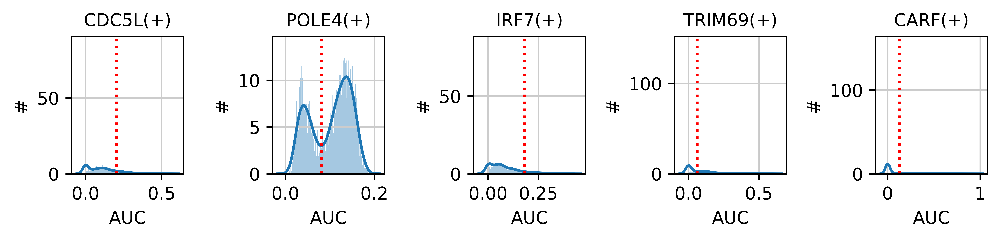

In [21]:
auc_sum = auc_mtx.apply(sum,axis=0).sort_values(ascending=False)
fig, axes = plt.subplots(1, 5, figsize=(8, 2), dpi=600)
for x,y in enumerate(axes):
    plot_binarization(auc_mtx, auc_sum.index[x], thresholds[auc_sum.index[x]], ax=y)
plt.tight_layout()
plt.savefig("/public/home/zhaox/pigscRNA-seq/auc_binarization0505.pdf")

In [87]:
### We can also add all metadata derived from SCENIC to the scanpy.AnnData object.
# load the regulons from a file using the load_signatures function
from pyscenic.plotting import plot_binarization
from pyscenic.export import add_scenic_metadata
from pyscenic.cli.utils import load_signatures
sig = load_signatures('/public/home/zhaox/pigscRNA-seq/adultgerm0504_reg.csv')
adata = add_scenic_metadata(adata, auc_mtx, sig)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [24]:
df_motifs = load_motifs('/public/home/zhaox/pigscRNA-seq/adultgerm0504_reg.csv')
df_motifs

Enrichment             
                                                             AUC       NES   
TF     MotifID                                                               
ALX1   cisbp__M1189                                     0.079555  3.360715  \
ALX3   cisbp__M1091                                     0.072202  3.050986   
       cisbp__M1025                                     0.075141  3.308126   
       taipale__HOXB2_DBD_NNYMATTANN                    0.071622  3.000252   
       cisbp__M1017                                     0.071733  3.010020   
...                                                          ...       ...   
ZNF436 transfac_pro__M06474                             0.072486  3.627393   
       transfac_pro__M06656                             0.072664  3.644605   
ZNF641 transfac_pro__M05417                             0.062496  3.041720   
ZNF740 flyfactorsurvey__CG7368_SOLEXA_2.5_FBgn0036179   0.073161  3.195254   
       c2h2_zfs__M4021                                  0.072512  3.135562   

                                                                              
                                                      MotifSimilarityQvalue   
TF     MotifID                                                                
ALX1   cisbp__M1189                                                0.000044  \
ALX3   cisbp__M1091                                                0.000790   
       cisbp__M1025                                                0.000384   
       taipale__HOXB2_DBD_NNYMATTANN                               0.000344   
       cisbp__M1017                                                0.000257   
...                                                                     ...   
ZNF436 transfac_pro__M06474                                        0.000000   
       transfac_pro__M06656                                        0.000000   
ZNF641 transfac_pro__M05417                                        0.000000   
ZNF740 flyfactorsurvey__CG7368_SOLEXA_2.5_FBgn0036179              0.000307   
       c2h2_zfs__M4021                                             0.000307   

                                                                            
                                                      OrthologousIdentity   
TF     MotifID                                                              
ALX1   cisbp__M1189                                              1.000000  \
ALX3   cisbp__M1091                                              1.000000   
       cisbp__M1025                                              1.000000   
       taipale__HOXB2_DBD_NNYMATTANN                             1.000000   
       cisbp__M1017                                              1.000000   
...                                                                   ...   
ZNF436 transfac_pro__M06474                                      0.946903   
       transfac_pro__M06656                                      1.000000   
ZNF641 transfac_pro__M05417                                      1.000000   
ZNF740 flyfactorsurvey__CG7368_SOLEXA_2.5_FBgn0036179            0.894444   
       c2h2_zfs__M4021                                           0.894444   

                                                                                                           
                                                                                              Annotation   
TF     MotifID                                                                                             
ALX1   cisbp__M1189                                    motif similar to transfac_pro__M01453 ('V$CART...  \
ALX3   cisbp__M1091                                    motif similar to taipale__ALX3_DBD_NNYAATTANN ...   
       cisbp__M1025                                    motif similar to cisbp__M5284 ('ALX3[gene ID: ...   
       taipale__HOXB2_DBD_NNYMATTANN                   motif similar to cisbp__M5284 ('ALX3[gene ID: ...   
       cisbp__M1017

In [88]:
adata

AnnData object with n_obs × n_vars = 3655 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type', 'Regulon(AEBP2(+))', 'Regulon(ALX1(+))', 'Regulon(ALX3(+))', 'Regulon(AR(+))', 'Regulon(ARID3A(+))', 'Regulon(ARID3C(+))', 'Regulon(ARNT(+))', 'Regulon(ARNT2(+))', 'Regulon(ASCL1(+))', 'Regulon(ASCL2(+))', 'Regulon(ATF2(+))', 'Regulon(ATF3(+))', 'Regulon(ATF4(+))', 'Regulon(ATF6(+))', 'Regulon(ATOH7(+))', 'Regulon(BACH1(+))', 'Regulon(BACH2(+))', 'Regulon(BARHL2(+))', 'Regulon(BARX1(+))', 'Regulon(BARX2(+))', 'Regulon(BATF3(+))', 'Regulon(BCL6(+))', 'Regulon(BCLAF1(+))', 'Regulon(BDP1(+))', 'Regulon(BHLHE40(+))', 'Regulon(BHLHE41(+))', 'Regulon(BRCA1(+))', 'Regulon(BRF1(+))', 'Regulon(BRF2(+))', 'Regulon(CARF(+))', 'Regulon(CDC5L(+))', 'Regulon(CEBPA(+))', 'Regulon(CEBPB(+))', 'Regulo

In [30]:
selected_motifs = ['ETV5','TP53','ZBTB18']
df_motifs_sel = df_motifs.iloc[ [ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF') ] ,:]

In [28]:
import operator as op

In [31]:
#display_logos(df_motifs.head())
display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/public/home/zhaox/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_161776/2979287111.py", line 2, in <module>
    display_logos( df_motifs_sel.sort_values([('Enrichment','NES')], ascending=False).head(9))
  File "/tmp/ipykernel_161776/1009801328.py", line 26, in display_logos
    pd.set_option('display.max_colwidth', -1)
  File "/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/pandas/_config/config.py", line 261, in __call__
  File "/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/pandas/_config/config.py", line 160, in _set_option
    o.validator(v)
  File "/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/pandas/_config/config.py", line 882, in is_nonnegative_int
    return
ValueError: Value must be a nonnegative integer or None

During handling of the a

In [42]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

In [44]:
rss_cellType = regulon_specificity_scores(auc_mtx, adata.obs['cell_type'] )
rss_cellType

,AEBP2(+),ALX1(+),ALX3(+),AR(+),ARID3A(+),ARID3C(+),ARNT(+),ARNT2(+),ASCL1(+),ASCL2(+),...,ZNF362(+),ZNF423(+),ZNF425(+),ZNF436(+),ZNF444(+),ZNF471(+),ZNF541(+),ZNF641(+),ZNF740(+),ZNF84(+)
D,0.202488,0.230307,0.269807,0.218749,0.287466,0.191554,0.221364,0.222847,0.188660,0.201844,...,0.176965,0.196048,0.188712,0.216722,0.223522,0.201157,0.216856,0.183070,0.261525,0.333577
DiffedSPG,0.251796,0.262241,0.311652,0.267889,0.263655,0.181142,0.248667,0.251089,0.190309,0.212016,...,0.195629,0.197437,0.225358,0.210336,0.195204,0.225796,0.210397,0.225496,0.329190,0.309087
ES,0.211265,0.231891,0.233103,0.303698,0.297440,0.182820,0.175475,0.342343,0.191042,0.201179,...,0.239710,0.183720,0.203993,0.281852,0.219109,0.187194,0.188955,0.210517,0.240196,0.231376
STO,0.265568,0.342276,0.321660,0.509278,0.282210,0.192183,0.197424,0.509841,0.196161,0.234182,...,0.293523,0.202339,0.263761,0.445684,0.293139,0.191330,0.215291,0.290529,0.335822,0.317166
SSC,0.250291,0.229481,0.268208,0.256975,0.216919,0.189240,0.198857,0.235303,0.213382,0.225728,...,0.208828,0.275443,0.211814,0.205570,0.185437,0.198090,0.213047,0.205138,0.267718,0.236237
L,0.180149,0.194571,0.196128,0.188705,0.189692,0.167445,0.202631,0.182292,0.173124,0.167600,...,0.168871,0.172796,0.179914,0.172644,0.168408,0.180470,0.176319,0.195978,0.194860,0.199779
P,0.261490,0.305681,0.335924,0.228484,0.377624,0.195976,0.349276,0.231804,0.246245,0.244307,...,0.177366,0.209734,0.285078,0.226401,0.287769,0.264686,0.261676,0.178198,0.314837,0.365207
Z,0.175115,0.233986,0.233466,0.227453,0.237420,0.168153,0.332849,0.211091,0.172141,0.177233,...,0.172202,0.175813,0.222827,0.172221,0.178496,0.270023,0.195371,0.257182,0.223795,0.254223
DiffingSPG,0.245779,0.189996,0.237535,0.223248,0.204932,0.167445,0.188603,0.204897,0.173984,0.172991,...,0.177894,0.181539,0.193132,0.185954,0.168967,0.186950,0.187849,0.191050,0.251243,0.222972
RS,0.179858,0.178694,0.186925,0.178722,0.264557,0.179298,0.187453,0.183574,0.204742,0.195995,...,0.168813,0.172113,0.185941,0.171115,0.183135,0.184926,0.179376,0.172157,0.178859,0.195790


In [45]:
cats = sorted(list(set(adata.obs['cell_type'])))

fig = plt.figure(figsize=(15, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(2,5,num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("adultgerm_celltype-RSS-top5.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [46]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

In [47]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

/tmp/ipykernel_161776/68287874.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
/tmp/ipykernel_161776/68287874.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
/tmp/ipykernel_161776/68287874.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining

In [48]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [49]:
colors = sns.color_palette('bright',n_colors=len(cats) )
colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in adata.obs['cell_type']]

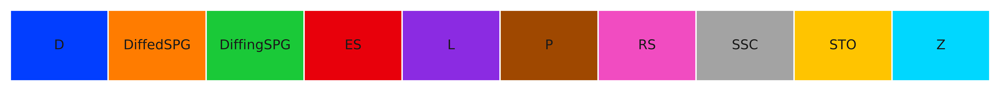

In [50]:
sns.set()
sns.set(font_scale=0.8)
fig = palplot( colors, cats, size=1.0)
plt.savefig("adultgerm_cellType-heatmap-legend-top5.pdf", dpi=600, bbox_inches = "tight")

In [51]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
plt.savefig("adultgerm_cellType-heatmap-top5.pdf", dpi=600, bbox_inches = "tight")

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


In [90]:
binary_mtx, auc_thresholds = binarize( auc_mtx, num_workers=25 )
binary_mtx.head()

,AEBP2(+),ALX1(+),ALX3(+),AR(+),ARID3A(+),ARID3C(+),ARNT(+),ARNT2(+),ASCL1(+),ASCL2(+),...,ZNF362(+),ZNF423(+),ZNF425(+),ZNF436(+),ZNF444(+),ZNF471(+),ZNF541(+),ZNF641(+),ZNF740(+),ZNF84(+)
AAACCCAAGATGTAGT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
AAACCCAAGGCTCTAT-1,0,1,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
AAACCCAAGTAAACAC-1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,1,0,0,0,0
AAACCCAAGTGGAAGA-1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0
AAACCCAGTCCAGGTC-1,1,0,1,0,0,0,1,0,0,0,...,0,0,1,0,1,0,1,0,1,0


/tmp/ipykernel_121970/480748720.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
/tmp/ipykernel_121970/480748720.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
/tmp/ipykernel_121970/480748

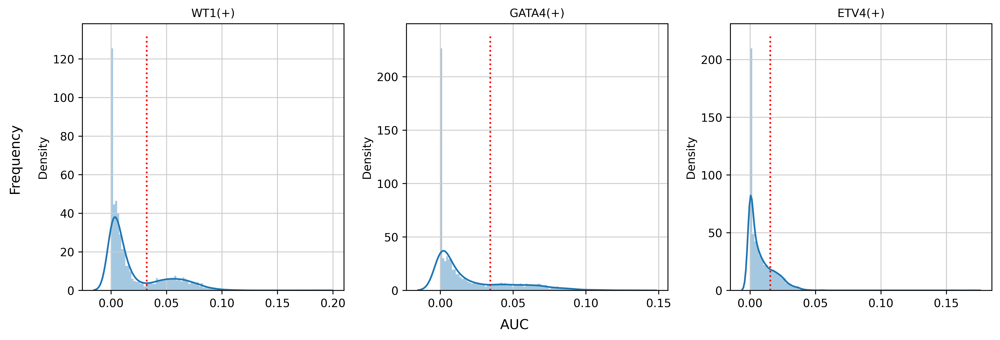

In [93]:
# select regulons:
r = ['WT1(+)','GATA4(+)','ETV4(+)']

fig, axs = plt.subplots(1, 3, figsize=(12, 4), dpi=300, sharey=False)
for i,ax in enumerate(axs):
    sns.distplot(auc_mtx[ r[i] ], ax=ax, norm_hist=True, bins=100)
    ax.plot( [ auc_thresholds[ r[i] ] ]*2, ax.get_ylim(), 'r:')
    ax.title.set_text( r[i] )
    ax.set_xlabel('')
    
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='large')
fig.text(0.5, -0.01, 'AUC', ha='center', va='center', rotation='horizontal', size='large')

fig.tight_layout()
fig.savefig('adultgerm_cellType-binaryPlot2_WT1.pdf', dpi=600, bbox_inches='tight')

In [ ]:
sc.set_figure_params(frameon=False, dpi=600, fontsize=10, dpi_save=600)
sc.pl.scatter( adata, basis='highly_variable_genes_UMAP', 
    color=['Louvain_clusters_Scanpy','Celltype_Garnett'],
    title=['HVG - UMAP (Louvain clusters)','HVG - UMAP (Cell type)'],
    alpha=0.8,
    save='_Louvain-celltype.pdf'
    )
sc.pl.scatter( adata, basis='SCENIC_AUC_UMAP', 
    color=['Louvain_clusters_Scanpy','Celltype_Garnett'],
    title=['SCENIC - UMAP (Louvain clusters)','SCENIC - UMAP (Cell type)'], 
    alpha=0.8,
    save='_Louvain-celltype.pdf'
    )

In [94]:
adata

AnnData object with n_obs × n_vars = 3655 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type', 'Regulon(AEBP2(+))', 'Regulon(ALX1(+))', 'Regulon(ALX3(+))', 'Regulon(AR(+))', 'Regulon(ARID3A(+))', 'Regulon(ARID3C(+))', 'Regulon(ARNT(+))', 'Regulon(ARNT2(+))', 'Regulon(ASCL1(+))', 'Regulon(ASCL2(+))', 'Regulon(ATF2(+))', 'Regulon(ATF3(+))', 'Regulon(ATF4(+))', 'Regulon(ATF6(+))', 'Regulon(ATOH7(+))', 'Regulon(BACH1(+))', 'Regulon(BACH2(+))', 'Regulon(BARHL2(+))', 'Regulon(BARX1(+))', 'Regulon(BARX2(+))', 'Regulon(BATF3(+))', 'Regulon(BCL6(+))', 'Regulon(BCLAF1(+))', 'Regulon(BDP1(+))', 'Regulon(BHLHE40(+))', 'Regulon(BHLHE41(+))', 'Regulon(BRCA1(+))', 'Regulon(BRF1(+))', 'Regulon(BRF2(+))', 'Regulon(CARF(+))', 'Regulon(CDC5L(+))', 'Regulon(CEBPA(+))', 'Regulon(CEBPB(+))', 'Regulo

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


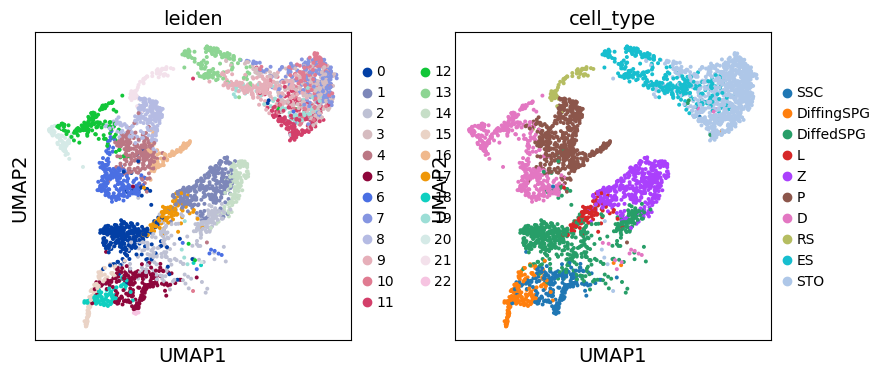

In [95]:
sc.settings.set_figure_params(dpi = 50, dpi_save = 600, figsize = (4, 4))
sc.pl.umap(adata, color=['leiden','cell_type'], frameon=True, legend_loc= "right margin", legend_fontsize=10, legend_fontweight="normal", legend_fontoutline=2, save="pyscenic_celltype0922.pdf")

In [106]:
sc.tl.tsne(adata, use_rep='X_aucell')

computing tSNE
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:02:50)


In [107]:
embedding_aucell_tsne = pd.DataFrame(adata.obsm['X_tsne'], columns=[['_X', '_Y']], index=adata.obs_names)

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


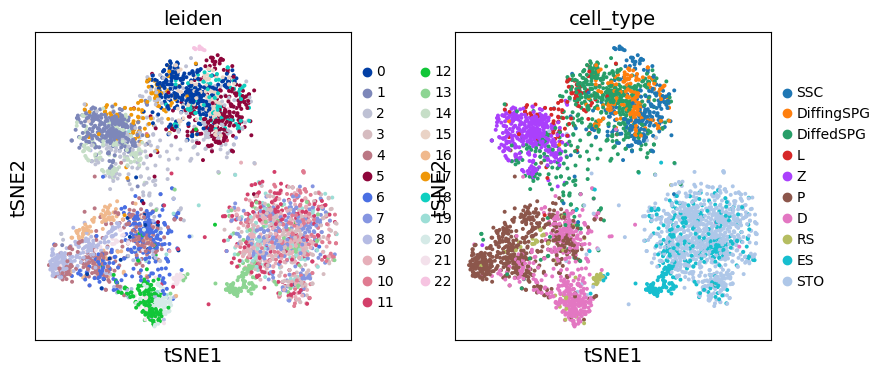

In [108]:
sc.settings.set_figure_params(dpi = 50, dpi_save = 600, figsize = (4, 4))
sc.pl.tsne(adata, color=['leiden','cell_type'], frameon=True, legend_loc= "right margin", legend_fontsize=10, legend_fontweight="normal", legend_fontoutline=2, save="pyscenic_aucellcelltype0922.pdf")

In [109]:
??sc.tl.umap

Signature:
sc.tl.umap(
    adata: anndata._core.anndata.AnnData,
    min_dist: float = 0.5,
    spread: float = 1.0,
    n_components: int = 2,
    maxiter: Optional[int] = None,
    alpha: float = 1.0,
    gamma: float = 1.0,
    negative_sample_rate: int = 5,
    init_pos: Union[Literal['paga', 'spectral', 'random'], numpy.ndarray, NoneType] = 'spectral',
    random_state: Union[NoneType, int, numpy.random.mtrand.RandomState] = 0,
    a: Optional[float] = None,
    b: Optional[float] = None,
    copy: bool = False,
    method: Literal['umap', 'rapids'] = 'umap',
    neighbors_key: Optional[str] = None,
) -> Optional[anndata._core.anndata.AnnData]
Docstring:
Embed the neighborhood graph using UMAP [McInnes18]_.

UMAP (Uniform Manifold Approximation and Projection) is a manifold learning
technique suitable for visualizing high-dimensional data. Besides tending to
be faster than tSNE, it optimizes the embedding such that it best reflects
the topology of the data, which we represent thro

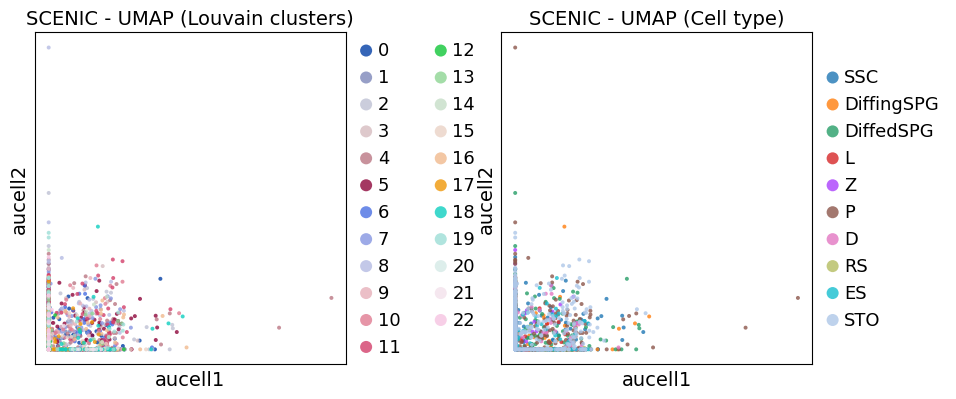

In [104]:
sc.pl.scatter( adata, basis='aucell', 
    color=['leiden','cell_type'],
    title=['SCENIC - UMAP (Louvain clusters)','SCENIC - UMAP (Cell type)'], 
    alpha=0.8,
    save='pyscenic_aucell_celltype0922.pdf'
    )

In [54]:
adjacencies = pd.read_csv("/public/home/zhaox/pigscRNA-seq/adultgerm0504_adj.tsv", index_col=False, sep='\t')

In [56]:
lf = lp.connect("/public/home/zhaox/pigscRNA-seq/adultgerm_removeothers0504_filtered_scenic.loom", mode='r', validate=False )
exprMat = pd.DataFrame(lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID).T

In [57]:
from pyscenic.utils import modules_from_adjacencies
modules = list(modules_from_adjacencies(adjacencies, exprMat))


2023-05-05 16:10:49,967 - pyscenic.utils - INFO - Calculating Pearson correlations.

2023-05-05 16:10:51,002 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'rho_mask_dropouts=True' in the modules_from_adjacencies function, or '--mask_dropouts' from the CLI.
	Dropout masking is currently set to [False].

2023-05-05 16:11:33,553 - pyscenic.utils - INFO - Creating modules.


In [ ]:
# from scipy.sparse import csr_matrix
# adata_spermatogonia_only.X = csr_matrix(adata_spermatogonia_only.X)
# adultspermatogonia_mat=pd.DataFrame(data=adata_spermatogonia_only.X.todense(),index=adata_spermatogonia_only.obs_names,columns=adata_spermatogonia_only.var_names)

In [64]:
topreg

['HES6(+)',
 'PBX3(+)',
 'GMEB1(+)',
 'WT1(+)',
 'SOX5(+)',
 'ARID3A(+)',
 'CTCFL(+)',
 'NFIC(+)',
 'BDP1(+)',
 'LHX4(+)',
 'TRIM69(+)',
 'STAT6(+)',
 'MYLK(+)',
 'SP1(+)',
 'E2F2(+)',
 'POLR3G(+)',
 'CARF(+)',
 'STAT1(+)',
 'YBX1(+)',
 'MXD4(+)',
 'MECOM(+)',
 'PHOX2A(+)',
 'ETV4(+)',
 'IRF7(+)',
 'MAFA(+)',
 'PRRX2(+)',
 'E2F7(+)',
 'E2F1(+)',
 'TBR1(+)',
 'KLF10(+)',
 'NR2F6(+)',
 'BARX2(+)',
 'TRPS1(+)',
 'JDP2(+)',
 'NKX2-3(+)',
 'GATA4(+)',
 'RFX4(+)',
 'RFX2(+)',
 'ATF6(+)',
 'TAF1(+)',
 'DLX6(+)',
 'TCF12(+)',
 'NR5A1(+)',
 'KDM5B(+)',
 'HDAC1(+)',
 'HNF4A(+)']

In [65]:
df_motifs = load_motifs('/public/home/zhaox/pigscRNA-seq/adultgerm0504_reg.csv')

In [88]:
selected_motifs = ['HES6(+)',
 'PBX3(+)',
 'GMEB1(+)',
 'WT1(+)',
 'SOX5(+)',
 'ARID3A(+)',
 'CTCFL(+)',
 'NFIC(+)',
 'BDP1(+)',
 'LHX4(+)',
 'TRIM69(+)',
 'STAT6(+)',
 'MYLK(+)',
 'SP1(+)',
 'E2F2(+)',
 'POLR3G(+)',
 'CARF(+)',
 'STAT1(+)',
 'YBX1(+)',
 'MXD4(+)',
 'MECOM(+)',
 'PHOX2A(+)',
 'ETV4(+)',
 'IRF7(+)',
 'MAFA(+)',
 'PRRX2(+)',
 'E2F7(+)',
 'E2F1(+)',
 'TBR1(+)',
 'KLF10(+)',
 'NR2F6(+)',
 'BARX2(+)',
 'TRPS1(+)',
 'JDP2(+)',
 'NKX2-3(+)',
 'GATA4(+)',
 'RFX4(+)',
 'RFX2(+)',
 'ATF6(+)',
 'TAF1(+)',
 'DLX6(+)',
 'TCF12(+)',
 'NR5A1(+)',
 'KDM5B(+)',
 'HDAC1(+)',
 'HNF4A(+)']

In [89]:
df_motifs_sel = df_motifs.iloc[[ True if x in selected_motifs else False for x in df_motifs.index.get_level_values('TF')],:]

In [78]:
# helper functions (not yet integrated into pySCENIC):

from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', 200)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [71]:
def fetch_logo(regulon, base_url = "http://motifcollections.aertslab.org/v10/logos/"):
    for elem in regulon.context:
        if elem.endswith('.png'):
            return '<img src="{}{}" style="max-height:124px;"></img>'.format(base_url, elem)
    return ""

In [80]:
from pyscenic.utils import load_motifs
import operator as op
from IPython.display import HTML, display

In [91]:
#display_logos(df_motifs.head())
display_logos(df_motifs.sort_values([('Enrichment','NES')], ascending=False).head(30))

In [86]:
df_motifs.sort_values([('Enrichment','NES')])

Enrichment              
                                                          AUC        NES   
TF    MotifID                                                              
ATF4  transfac_pro__M01863                           0.117854   3.000131  \
ALX3  taipale__HOXB2_DBD_NNYMATTANN                  0.071622   3.000252   
NR1H2 taipale_cyt_meth__NR2F6_NRGGTCRNTGACCYN_eDBD   0.053900   3.000288   
KLF16 hocomoco__ZN263_HUMAN.H11MO.0.A                0.061592   3.000308   
SRF   dbcorrdb__SRF__ENCSR000BLK_1__m1               0.076684   3.000424   
...                                                       ...        ...   
E2F1  cisbp__M6194                                   0.305431  13.777929   
      cisbp__M3134                                   0.306059  13.808076   
      transfac_pro__M00919                           0.308118  13.906808   
      transfac_pro__M00940                           0.315488  14.260283   
      transfac_pro__M00920                           0.326487  14.787857   

                                                                           
                                                   MotifSimilarityQvalue   
TF    MotifID                                                              
ATF4  transfac_pro__M01863                                      0.000036  \
ALX3  taipale__HOXB2_DBD_NNYMATTANN                             0.000344   
NR1H2 taipale_cyt_meth__NR2F6_NRGGTCRNTGACCYN_eDBD              0.000904   
KLF16 hocomoco__ZN263_HUMAN.H11MO.0.A                           0.000965   
SRF   dbcorrdb__SRF__ENCSR000BLK_1__m1                          0.000000   
...                                                                  ...   
E2F1  cisbp__M6194                                              0.000012   
      cisbp__M3134                                              0.000000   
      transfac_pro__M00919                                      0.000000   
      transfac_pro__M00940                                      0.000004   
      transfac_pro__M00920                                      0.000000   

                                                                         
                                                   OrthologousIdentity   
TF    MotifID                                                            
ATF4  transfac_pro__M01863                                         1.0  \
ALX3  taipale__HOXB2_DBD_NNYMATTANN                                1.0   
NR1H2 taipale_cyt_meth__NR2F6_NRGGTCRNTGACCYN_eDBD                 1.0   
KLF16 hocomoco__ZN263_HUMAN.H11MO.0.A                              1.0   
SRF   dbcorrdb__SRF__ENCSR000BLK_1__m1                             1.0   
...                                                                ...   
E2F1  cisbp__M6194                                                 1.0   
      cisbp__M3134                                                 1.0   
      transfac_pro__M00919                                         1.0   
      transfac_pro__M00940                                         1.0   
      transfac_pro__M00920                                         1.0   

                                                                                                        
                                                                                           Annotation   
TF    MotifID                                                                                           
ATF4  transfac_pro__M01863                          gene is annotated for similar motif transfac_p...  \
ALX3  taipale__HOXB2_DBD_NNYMATTANN                 motif similar to cisbp__M5284 ('ALX3[gene ID: ...   
NR1H2 taipale_cyt_meth__NR2F6_NRGGTCRNTGACCYN_eDBD  gene is annotated for similar motif transfac_p...   
KLF16 hocomoco__ZN263_HUMAN.H11MO.0.A               gene is annotated for similar motif hocomoco__...   
SRF   dbcorrdb__SRF__ENCSR000BLK_1__m1                                     gene is directly annotated   
...                                         

In [ ]:
## 二值化热图

In [92]:
adata

AnnData object with n_obs × n_vars = 3655 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type', 'Regulon(AEBP2(+))', 'Regulon(ALX1(+))', 'Regulon(ALX3(+))', 'Regulon(AR(+))', 'Regulon(ARID3A(+))', 'Regulon(ARID3C(+))', 'Regulon(ARNT(+))', 'Regulon(ARNT2(+))', 'Regulon(ASCL1(+))', 'Regulon(ASCL2(+))', 'Regulon(ATF2(+))', 'Regulon(ATF3(+))', 'Regulon(ATF4(+))', 'Regulon(ATF6(+))', 'Regulon(ATOH7(+))', 'Regulon(BACH1(+))', 'Regulon(BACH2(+))', 'Regulon(BARHL2(+))', 'Regulon(BARX1(+))', 'Regulon(BARX2(+))', 'Regulon(BATF3(+))', 'Regulon(BCL6(+))', 'Regulon(BCLAF1(+))', 'Regulon(BDP1(+))', 'Regulon(BHLHE40(+))', 'Regulon(BHLHE41(+))', 'Regulon(BRCA1(+))', 'Regulon(BRF1(+))', 'Regulon(BRF2(+))', 'Regulon(CARF(+))', 'Regulon(CDC5L(+))', 'Regulon(CEBPA(+))', 'Regulon(CEBPB(+))', 'Regulo

In [93]:
cell_type_color_lut = dict(zip(adata.obs["cell_type"].dtype.categories, adata.uns["cell_type_colors"]))
cell_id2cell_type_lut = adata.obs["cell_type"].to_dict()
bw_palette = sns.xkcd_palette(["white", "black"])

In [95]:
sns.set()
sns.set(font_scale=1.0)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})
g = sns.clustermap(
    data=bin_mtx.T, 
    col_colors=auc_mtx.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
    cmap=bw_palette, figsize=(20,20)
    )
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])
g.cax.set_visible(False)
plt.savefig("adultgerm_cellType_Binaryactivity-heatmap.pdf", dpi=600, bbox_inches = "tight") 

/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/public/home/zhaox/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


In [105]:
import anndata
adata = anndata.read("/public/home/zhaox/pigscRNA-seq/figures/figures/fig3_adult_somaticgermCCC(removeothers)_rawdata_0428.h5ad")
adata

AnnData object with n_obs × n_vars = 3655 × 19297
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_chrX', 'pct_counts_chrX', 'total_counts_chrY', 'pct_counts_chrY', 'S_score', 'G2M_score', 'phase', 'doublet', 'doublet_score', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'chrX', 'chrY', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'dendrogram_cell_type', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    obsp: 'connectivities', 'distances'

In [106]:
adata.write("/public/home/zhaox/pigscRNA-seq/adultgerm_rawdata_forhdwgcna0506.h5ad", compression="gzip")

In [107]:
# Write the anndata meta data into csv formate
adata.write_csvs("adata", skip_data=False)